<br>

<h1 style="text-align:center;">Task 2: Petri Dish Detection and Extraction</h1>

## Overview

---

In the realm of Computer Vision, Region of Interest (ROI) extraction is a crucial technique that focuses on identifying and isolating specific parts of an image for detailed analysis. This targeted approach enhances both efficiency and accuracy by concentrating processing efforts on these selected areas.

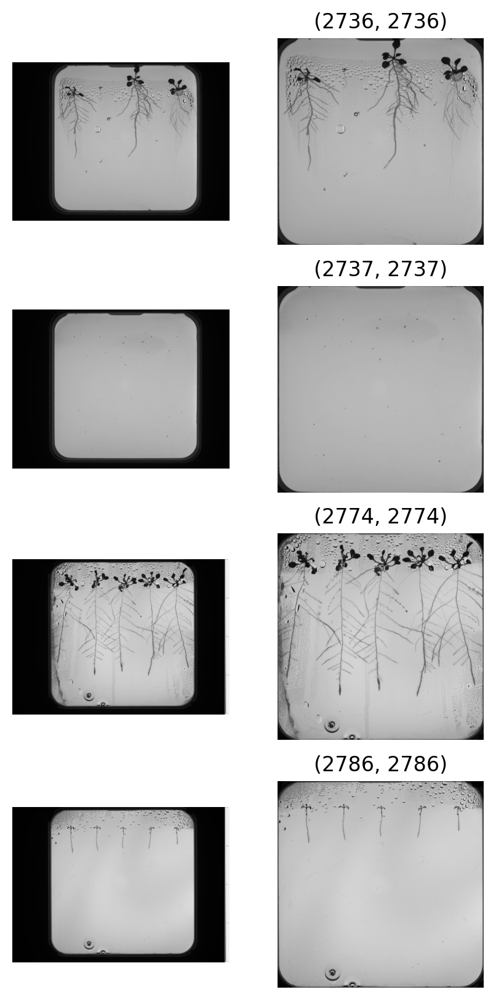

In this project, our ROI is the Petri Dish. The objective is to develop a Python script utilizing traditional computer vision methods to crop the Petri dish from raw images in the Y2B_23 and Y2B_24 datasets. It's important to note the differences between these datasets: Y2B_23 images feature a white legend on the right edge, while Y2B_24 images do not, and the Petri Dishes themselves vary between the datasets.

The extracted Petri Dish will be used in subsequent tasks to avoid processing irrelevant areas outside the dish, where no plant is present. This approach will save time and computational resources, and more importantly, improve the model's learning efficiency. While deep learning could be used for this task, traditional computer vision methods are preferred to avoid unnecessary complexity.

Assume that the Petri dish is a square with edges parallel to the image borders, although its location may vary between images. The cropped image must also be a square.


<br>

## Initial Setup

---

In [1]:
# Import the libraries
import numpy as np
import matplotlib.pyplot as plt
import cv2
import skimage
import os
from tqdm import tqdm
import random

<br>

## Extract Petri Dish

---

In this section, we modified the extract_petri_dish function to return both the cropped image and the coordinates of the crop, and added a helper function display_results to display the original and cropped images side by side using Matplotlib.



In [2]:
def extract_petri_dish(image):
    """
    Extracts a square region containing the Petri dish from the input image.
    
    Args:
        image: Input grayscale image
        
    Returns:
        Cropped square image containing the Petri dish
    """
    # Convert to grayscale if needed
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image.copy()
    
    # Apply Gaussian blur to reduce noise
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    
    # Use Otsu's thresholding to separate dish from background
    _, thresh = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Find contours
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Find the largest contour (should be the Petri dish)
    largest_contour = max(contours, key=cv2.contourArea)
    
    # Get bounding rectangle
    x, y, w, h = cv2.boundingRect(largest_contour)
    
    # Calculate the size of the square crop (use larger dimension)
    size = max(w, h)
    
    # Calculate new coordinates to center the dish
    center_x = x + w//2
    center_y = y + h//2
    
    # Calculate crop coordinates
    x1 = max(0, center_x - size//2)
    y1 = max(0, center_y - size//2)
    x2 = min(image.shape[1], x1 + size)
    y2 = min(image.shape[0], y1 + size)
    
    # Crop the image
    cropped = image[y1:y2, x1:x2]
    
    return cropped, (x1, y1, x2, y2)

In [3]:
def display_results(original, cropped, title):
    """Helper function to display original and cropped images side by side"""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    
    ax1.imshow(original, cmap='gray')
    ax1.set_title('Original Image')
    ax1.axis('off')
    
    ax2.imshow(cropped, cmap='gray')
    ax2.set_title('Cropped Petri Dish')
    ax2.axis('off')
    
    plt.suptitle(title)
    plt.show()

In [ ]:
# Load and process images from both datasets
# img_y2b23 = cv2.imread('images/img1.png', 0)
# cropped_y2b23, (x1, y1, x2, y2) = extract_petri_dish(img_y2b23)
# display_results(img_y2b23, cropped_y2b23, 'Y2B_23 Dataset')

<br>

## Extract Petri Dish for All Images

---

In this section, we created directories for storing cropped images and masks, defined paths, and implemented a function to process and crop images and masks from the dataset. We then processed both training and validation sets, sampled 20 random images from each set, and visualized the samples by displaying the original image, mask, and overlay.

In [5]:
# Create the target directories
os.makedirs('./../task4/dataset_cropped/train_images/train', exist_ok=True)
os.makedirs('./../task4/dataset_cropped/train_masks/train', exist_ok=True)
os.makedirs('./../task4/dataset_cropped/val_images/val', exist_ok=True)
os.makedirs('./../task4/dataset_cropped/val_masks/val', exist_ok=True)

In [6]:
# Define paths
base_path = './../task4/dataset'
cropped_path = './../task4/dataset_cropped'

def process_dataset(image_names, subset='train'):

    # Loop through all the images
    for image_name in tqdm(image_names, ncols=100, colour='green', desc=f'Processing {subset} images'):

        # Read image and mask
        image = cv2.imread(f'{base_path}/{subset}_images/{subset}/{image_name}', 0)
        mask = cv2.imread(f'{base_path}/{subset}_masks/{subset}/{image_name.replace(".png", ".tif")}', 0)
        
        # Crop image and mask
        cropped_image, (x1, y1, x2, y2) = extract_petri_dish(image)
        cropped_mask = mask[y1:y2, x1:x2]
        
        # Save cropped files
        cv2.imwrite(f'{cropped_path}/{subset}_images/{subset}/{image_name}', cropped_image)
        cv2.imwrite(f'{cropped_path}/{subset}_masks/{subset}/{image_name}', cropped_mask)

# Process both training and validation sets
train_images = os.listdir(f'{base_path}/train_images/train')
val_images = os.listdir(f'{base_path}/val_images/val')

process_dataset(train_images, 'train')
process_dataset(val_images, 'val')

Processing val images: 100%|████████████████████████████████████████| 45/45 [02:26<00:00,  3.25s/it]


Training samples:


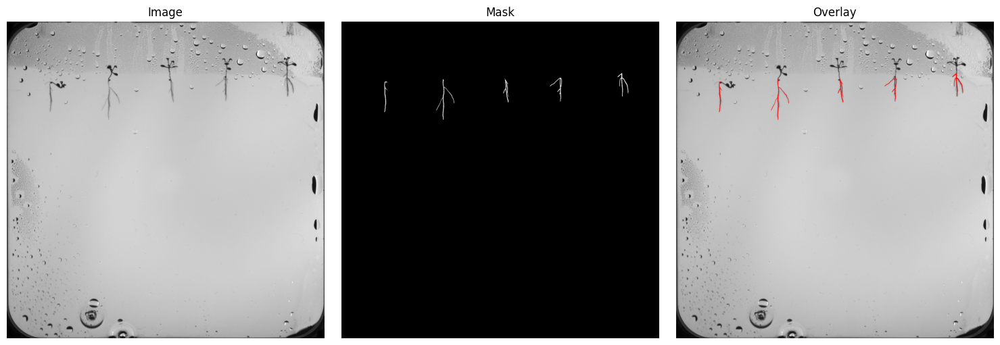

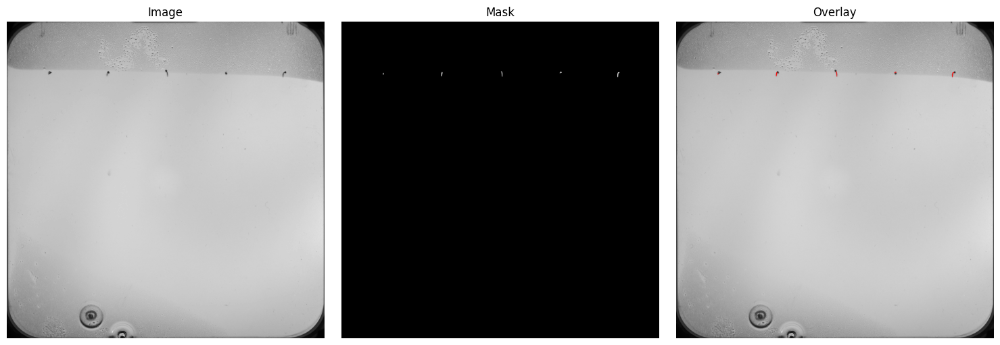

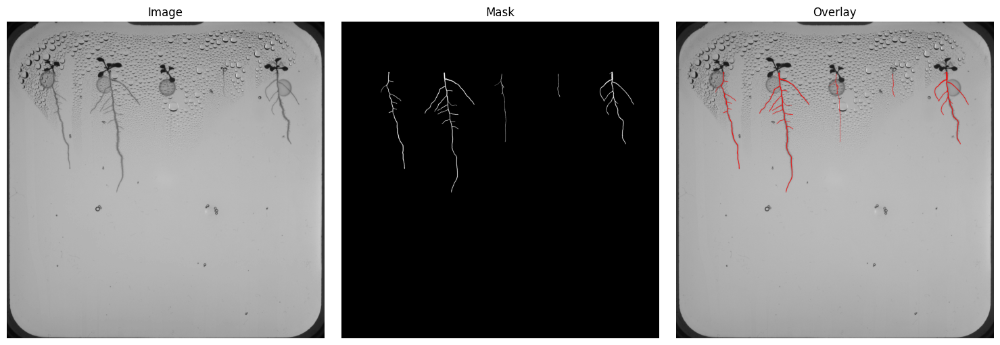

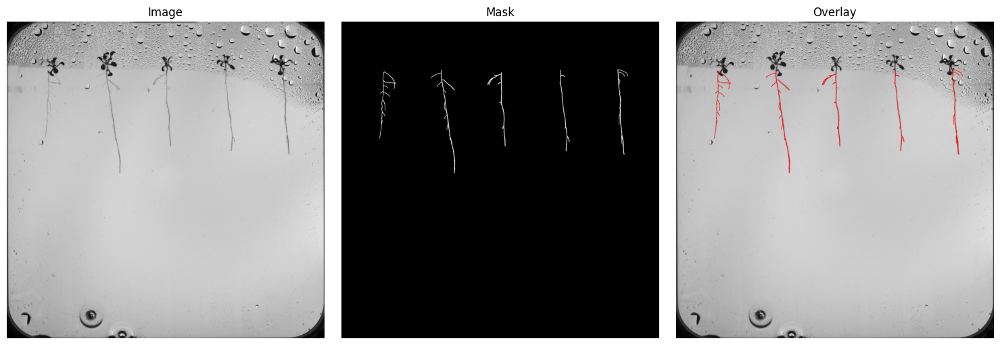

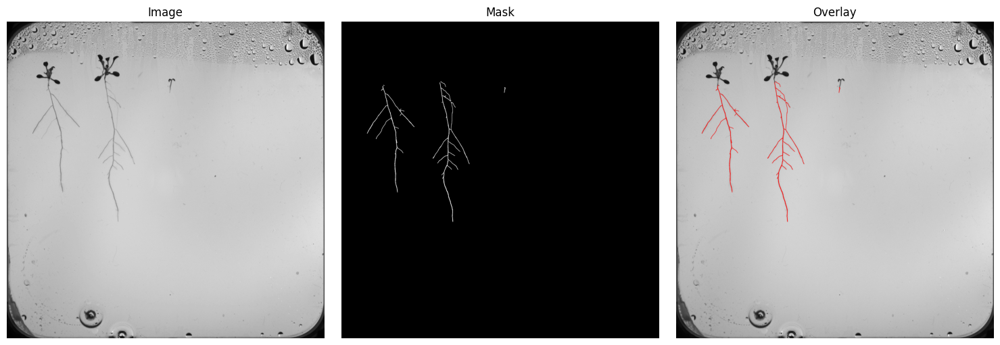

...

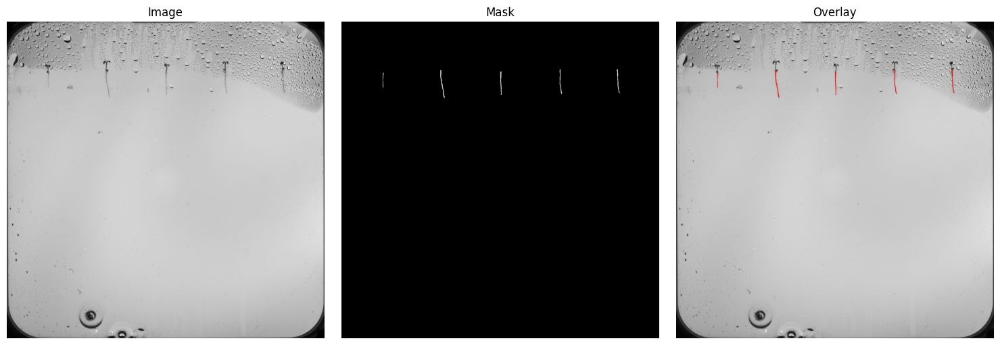

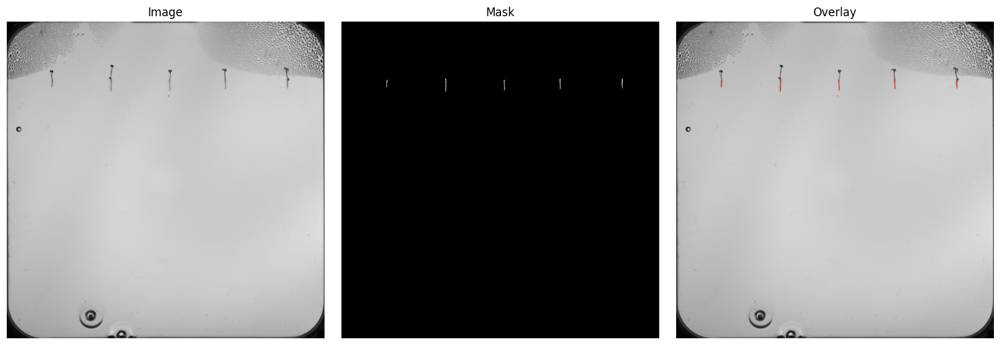

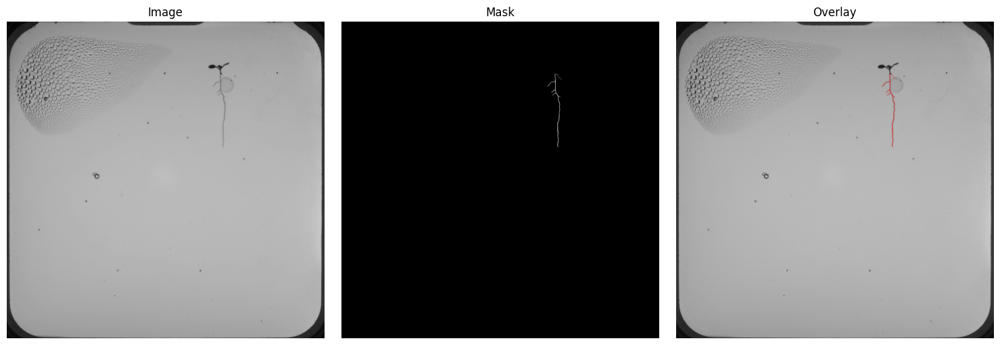

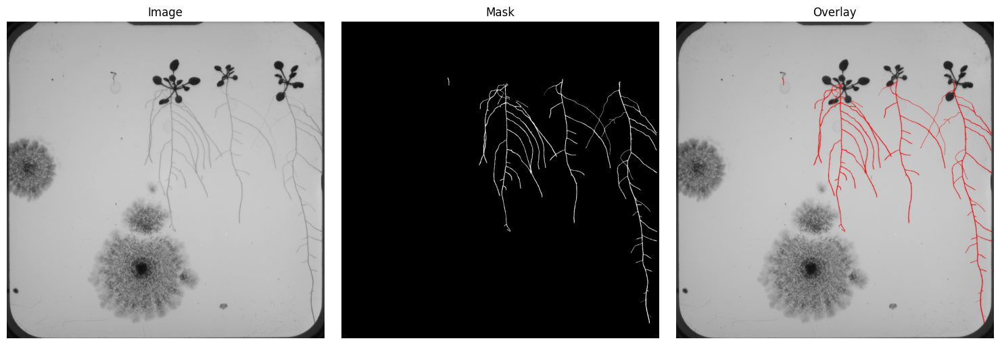

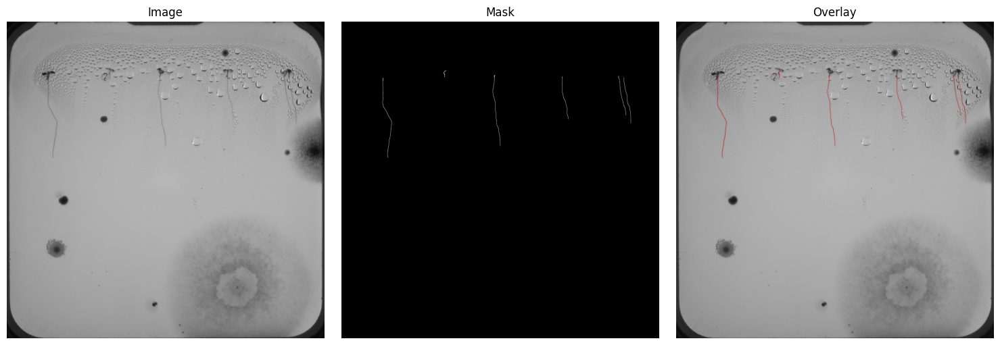


Validation samples:


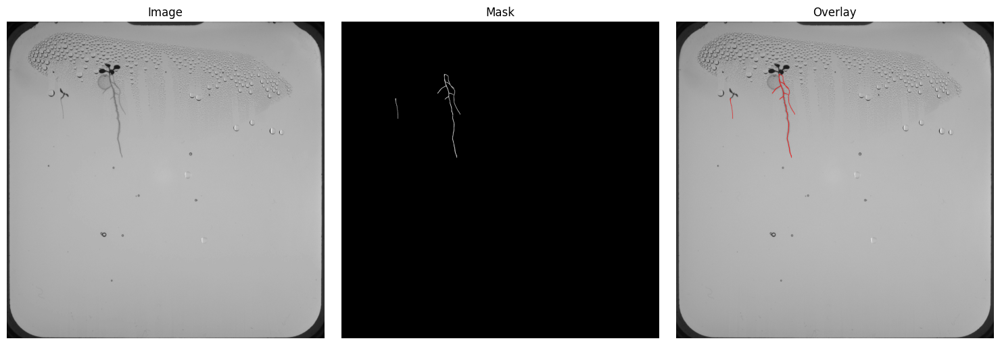

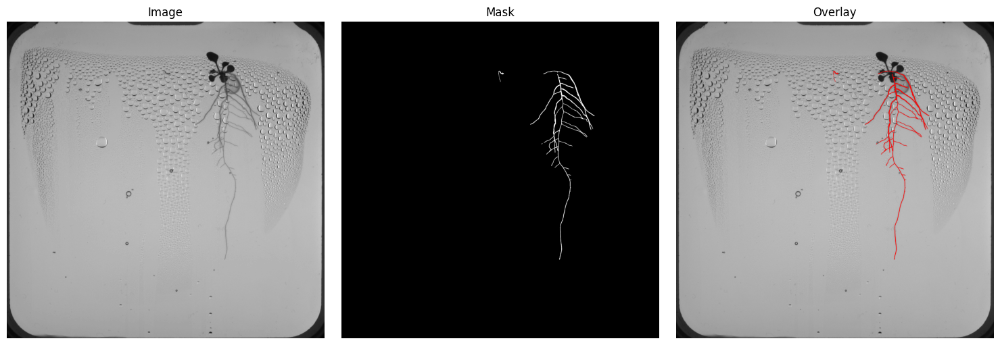

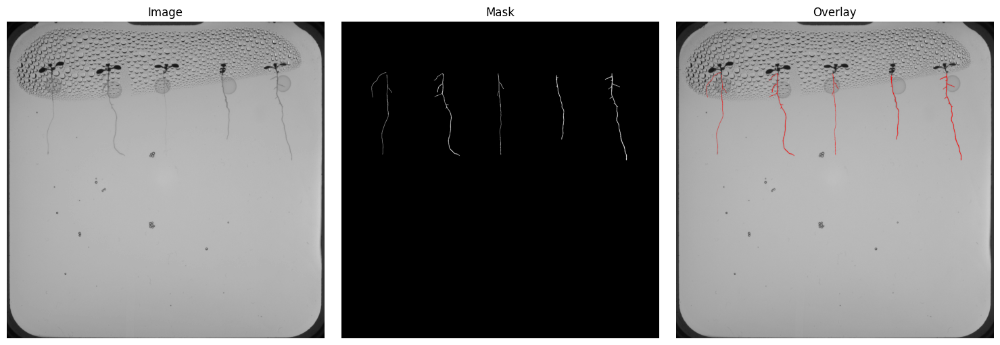

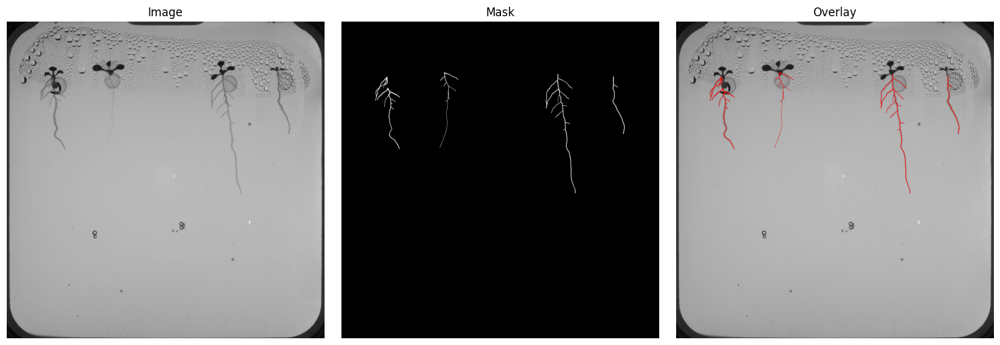

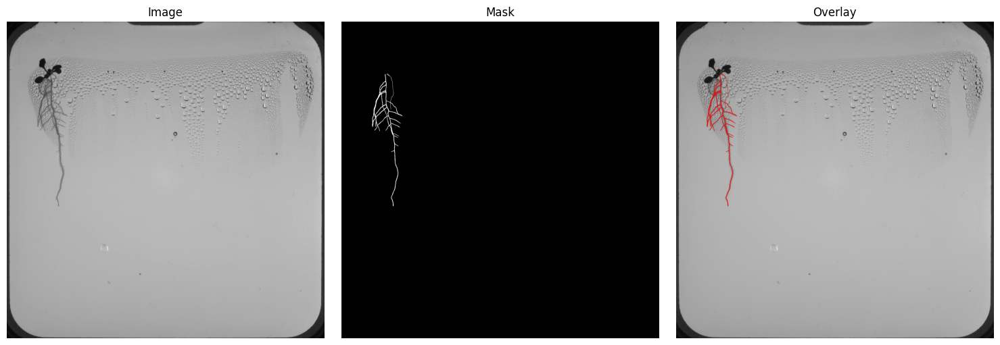

...

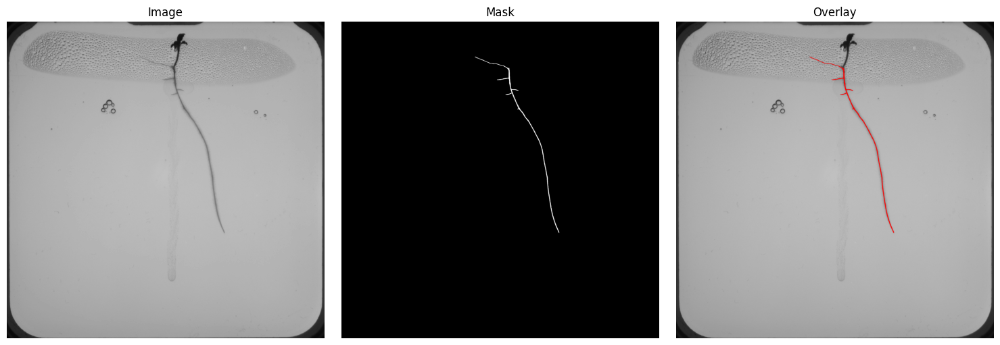

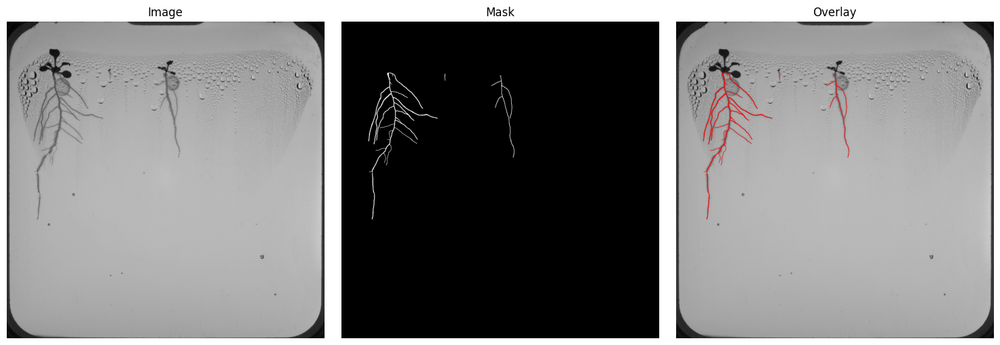

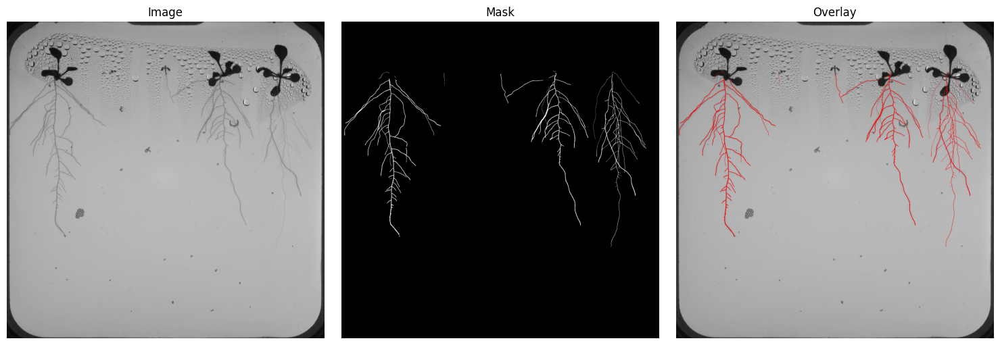

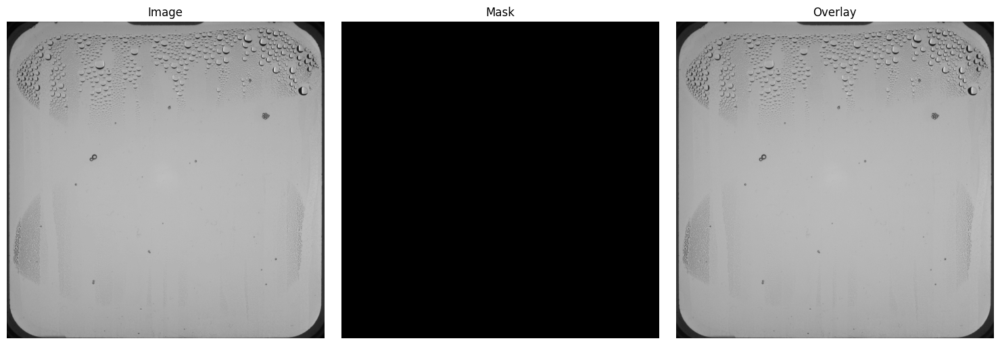

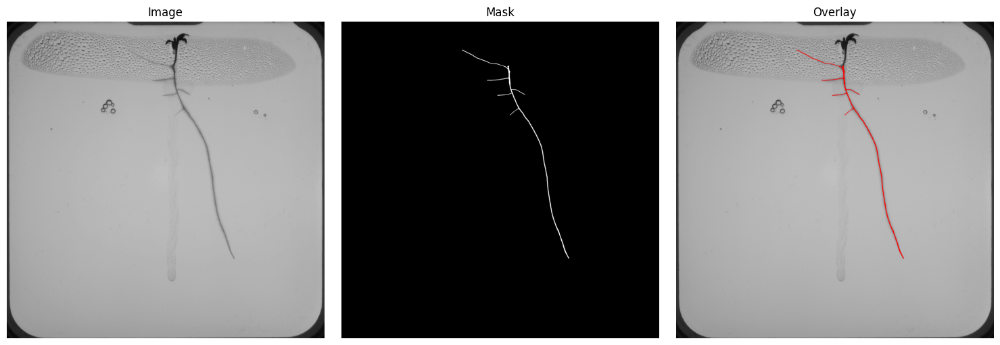

In [9]:
# Get list of all training and validation images
train_img_dir = "./../task4/dataset_cropped/train_images/train"
val_img_dir = "./../task4/dataset_cropped/val_images/val"

train_images = os.listdir(train_img_dir)
val_images = os.listdir(val_img_dir)

# Sample 20 random images from each set
train_samples = random.sample(train_images, 20)
val_samples = random.sample(val_images, 20)

# Visualize training samples
print("Training samples:")
for img_name in train_samples:
    img_path = os.path.join(train_img_dir, img_name)
    mask_path = img_path.replace("train_images", "train_masks")
    
    img = cv2.imread(img_path, 0)
    mask = cv2.imread(mask_path, 0)
    
    # Create a figure with 3 subplots
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))
    
    # Original image
    ax1.imshow(img, cmap='gray')
    ax1.set_title('Image')
    ax1.axis('off')
    
    # Mask
    ax2.imshow(mask, cmap='gray')
    ax2.set_title('Mask')
    ax2.axis('off')
    
    # Overlay
    overlay = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    overlay[mask > 0] = [255, 0, 0]
    ax3.imshow(overlay)
    ax3.set_title('Overlay')
    ax3.axis('off')
    
    plt.tight_layout()
    plt.show()

print("\nValidation samples:")
for img_name in val_samples:
    img_path = os.path.join(val_img_dir, img_name)
    mask_path = img_path.replace("val_images", "val_masks")
    
    img = cv2.imread(img_path, 0)
    mask = cv2.imread(mask_path, 0)
    
    # Create a figure with 3 subplots
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))
    
    # Original image
    ax1.imshow(img, cmap='gray')
    ax1.set_title('Image')
    ax1.axis('off')
    
    # Mask
    ax2.imshow(mask, cmap='gray')
    ax2.set_title('Mask')
    ax2.axis('off')
    
    # Overlay
    overlay = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    overlay[mask > 0] = [255, 0, 0]
    ax3.imshow(overlay)
    ax3.set_title('Overlay')
    ax3.axis('off')
    
    plt.tight_layout()
    plt.show()